# KAGGLE DATASET IMPORTS


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
##Prints all the directories for the kaggle dataset
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# IMPORTS

In [3]:
import math, re, os
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from kaggle_datasets import KaggleDatasets
from tensorflow import keras
from functools import partial
from sklearn.model_selection import train_test_split
print("Tensorflow version " + tf.__version__)

Tensorflow version 2.15.0


# Detect TPU (Only applicable when TPU accelerator is selected)

In [4]:
# try:
#     tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
#     print('Device:', tpu.master())
#     tf.config.experimental_connect_to_cluster(tpu)
#     tf.tpu.experimental.initialize_tpu_system(tpu)
#     strategy = tf.distribute.experimental.TPUStrategy(tpu)
# except:
#     strategy = tf.distribute.get_strategy()
# print('Number of replicas:', strategy.num_replicas_in_sync)

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU device:', tpu.master())
except:
    tpu = None
    
if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

else:
    strategy = tf.distribute.get_strategy()
    
print("Replicas: ", strategy.num_replicas_in_sync)

Running on TPU device: 
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local


2024-04-03 23:18:14.792012: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792126: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792214: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792319: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792397: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792596: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this stream.
2024-04-03 23:18:14.792685: E external/local_xla/xla/stream_executor/stream_executor_internal.h:177] SetPriority unimplemented for this 

INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Replicas:  8


# Initialize Variables

In [5]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
GCS_PATH = KaggleDatasets().get_gcs_path()
BATCH_SIZE = 16 * strategy.num_replicas_in_sync
IMAGE_SIZE = [512, 512]
CLASSES = ['0', '1', '2', '3', '4']
EPOCHS = 25

get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/cassava-leaf-disease-classification


# Load Data

## Decode Data

In [6]:
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

In [7]:
def read_tfrecord(example, labeled):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64)
    } if labeled else {
        "image": tf.io.FixedLenFeature([], tf.string),
        "image_name": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    if labeled:
        label = tf.cast(example['target'], tf.int32)
        return image, label
    idnum = example['image_name']
    return image, idnum

In [8]:
def load_dataset(filenames, labeled=True, ordered=False):
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTOTUNE) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(partial(read_tfrecord, labeled=labeled), num_parallel_calls=AUTOTUNE)
    return dataset

## Data Train/Test Split

A note on using train_test_split()
While I used train_test_split() to create both a training and validation dataset, consider exploring cross validation instead.

In [9]:
# NOTE: We will have to replace this with Cross Validation
# https://www.kaggle.com/code/jessemostipak/getting-started-tpus-cassava-leaf-disease?scriptVersionId=48618723&cellId=16

TRAINING_FILENAMES, VALID_FILENAMES = train_test_split(
    tf.io.gfile.glob(GCS_PATH + '/train_tfrecords/ld_train*.tfrec'),
    test_size=0.35, random_state=5
)

TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test_tfrecords/ld_test*.tfrec')

## Data Augmentation

In [10]:
def data_augment(image, label):
    # Thanks to the dataset.prefetch(AUTO) statement in the following function this happens essentially for free on TPU. 
    # Data pipeline code is executed on the "CPU" part of the TPU while the TPU itself is computing gradients.
    image = tf.image.random_flip_left_right(image)
    return image, label

## Data Loading Functions

In [11]:
def get_training_dataset():
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)  
    dataset = dataset.map(data_augment, num_parallel_calls=AUTOTUNE)  
    dataset = dataset.repeat()
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [12]:
def get_validation_dataset(ordered=False):
    dataset = load_dataset(VALID_FILENAMES, labeled=True, ordered=ordered) 
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [13]:
def get_test_dataset(ordered=False):
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [14]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

In [15]:
NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
NUM_VALIDATION_IMAGES = count_data_items(VALID_FILENAMES)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)

print('Dataset: {} training images, {} validation images, {} (unlabeled) test images'.format(
    NUM_TRAINING_IMAGES, NUM_VALIDATION_IMAGES, NUM_TEST_IMAGES))

Dataset: 13369 training images, 8028 validation images, 1 (unlabeled) test images


# Exploratory Data Analysis

In [16]:
print("Training data shapes:")
for image, label in get_training_dataset().take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Training data label examples:", label.numpy())
print("Validation data shapes:")
for image, label in get_validation_dataset().take(3):
    print(image.numpy().shape, label.numpy().shape)
print("Validation data label examples:", label.numpy())
print("Test data shapes:")
for image, idnum in get_test_dataset().take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Test data IDs:", idnum.numpy().astype('U')) # U=unicode string

Training data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Training data label examples: [3 3 3 4 3 1 3 0 2 3 3 3 3 1 4 1 3 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3
 3 3 3 2 3 1 4 2 3 3 3 2 3 2 4 3 3 3 3 3 3 1 3 4 2 2 3 2 3 3 3 4 1 3 4 4 3
 3 4 3 3 4 3 3 3 3 3 2 4 2 3 0 3 0 3 3 2 3 2 1 4 3 0 2 3 4 1 4 2 2 3 0 3 3
 3 3 3 0 1 3 3 1 1 3 3 3 3 3 3 3 3]
Validation data shapes:
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
(128, 512, 512, 3) (128,)
Validation data label examples: [0 3 3 4 2 3 2 1 3 4 2 3 3 1 3 4 3 4 4 3 3 3 3 3 3 2 3 3 3 4 3 0 0 1 1 3 3
 0 3 1 3 3 3 3 3 3 3 4 4 3 0 3 3 3 1 1 3 4 2 3 3 4 3 0 3 3 3 3 2 4 3 4 3 4
 3 3 2 3 2 1 3 3 3 3 3 3 3 3 1 3 3 3 3 1 0 2 3 2 1 4 2 0 3 3 4 3 3 2 3 3 3
 3 2 3 2 3 3 1 3 3 3 3 1 3 0 4 1 3]
Test data shapes:
(1, 512, 512, 3) (1,)
Test data IDs: ['2216849948.jpg']


The following code chunk sets up a series of functions that will print out a grid of images. The grid of images will contain images and their corresponding labels.

In [17]:
# numpy and matplotlib defaults
np.set_printoptions(threshold=15, linewidth=80)

def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object: # binary string in this case, these are image ID strings
        numpy_labels = [None for _ in enumerate(numpy_images)]
    # If no labels, only image IDs, return None for labels (this is the case for test data)
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_plant(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)

def display_batch_of_images(databatch, predictions=None):
    """This will work with:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # data
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
        
    # auto-squaring: this will drop data that does not fit into square or square-ish rectangle
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
        
    # size and spacing
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3 # magic formula tested to work from 1x1 to 10x10 images
        subplot = display_one_plant(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()

In [18]:
# load our training dataset for EDA
training_dataset = get_training_dataset()
training_dataset = training_dataset.unbatch().batch(20)
train_batch = iter(training_dataset)

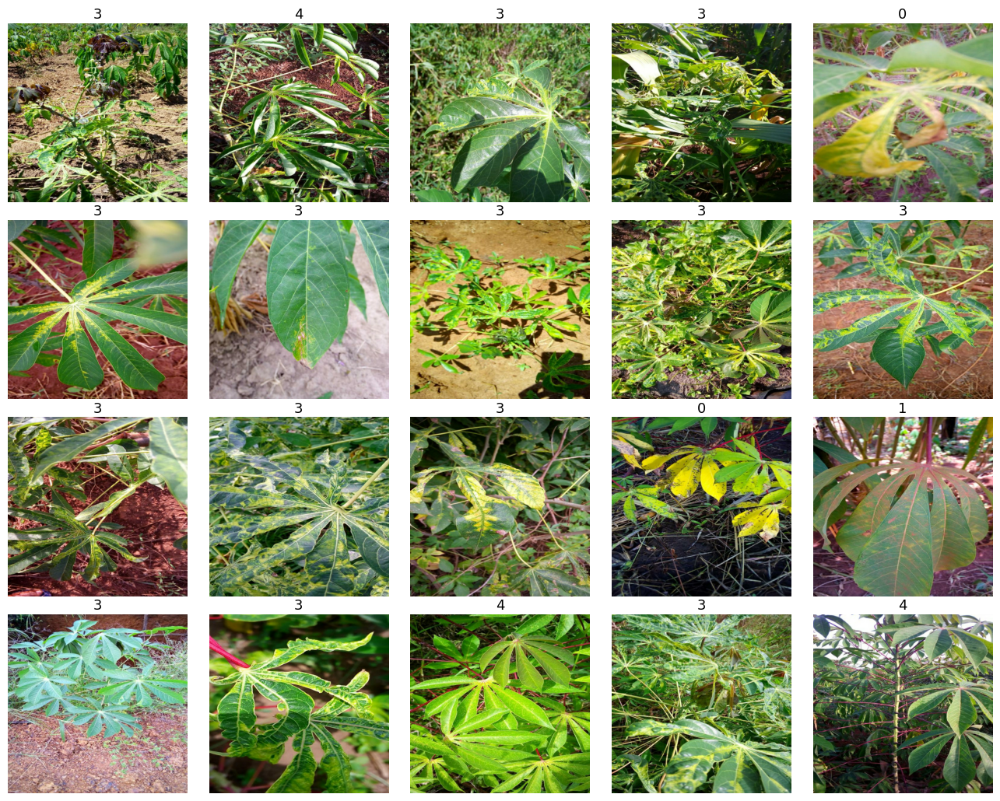

In [19]:
# run this cell again for another randomized set of training images
display_batch_of_images(next(train_batch))

You can also modify the above code to look at your validation and test data, like this:

In [20]:
# load our validation dataset for EDA
validation_dataset = get_validation_dataset()
validation_dataset = validation_dataset.unbatch().batch(20)
valid_batch = iter(validation_dataset)

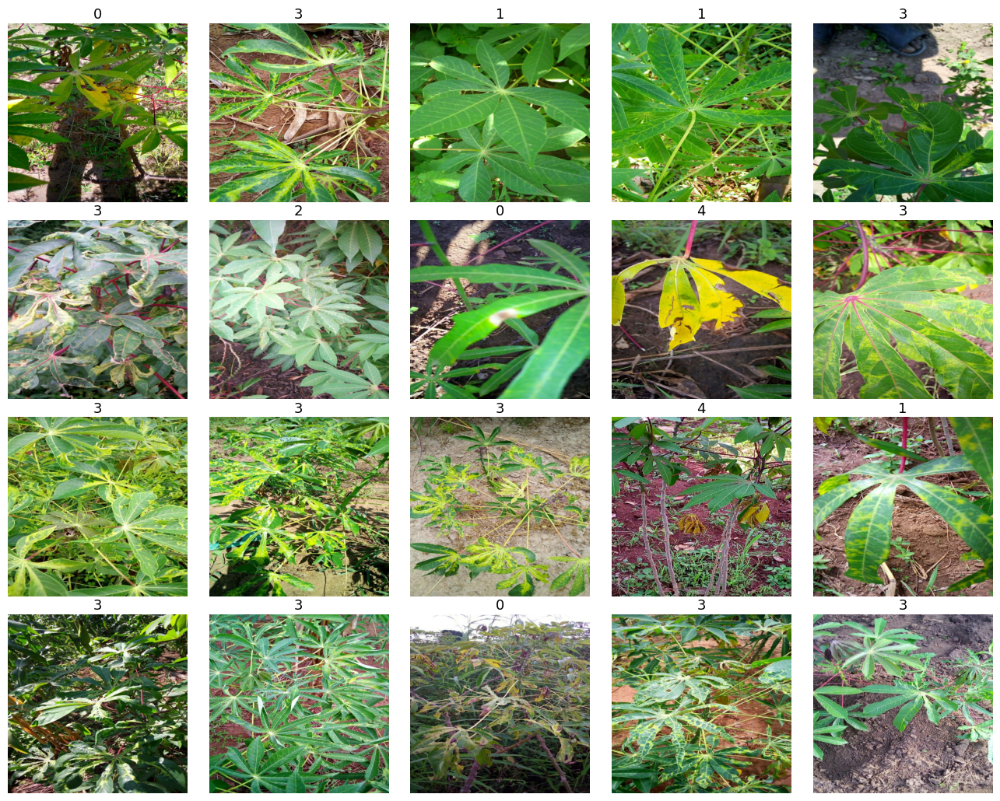

In [21]:
# run this cell again for another randomized set of training images
display_batch_of_images(next(valid_batch))

In [70]:
# load our test dataset for EDA
testing_dataset = get_test_dataset()
testing_dataset = testing_dataset.unbatch().batch(20)
test_batch = iter(testing_dataset)

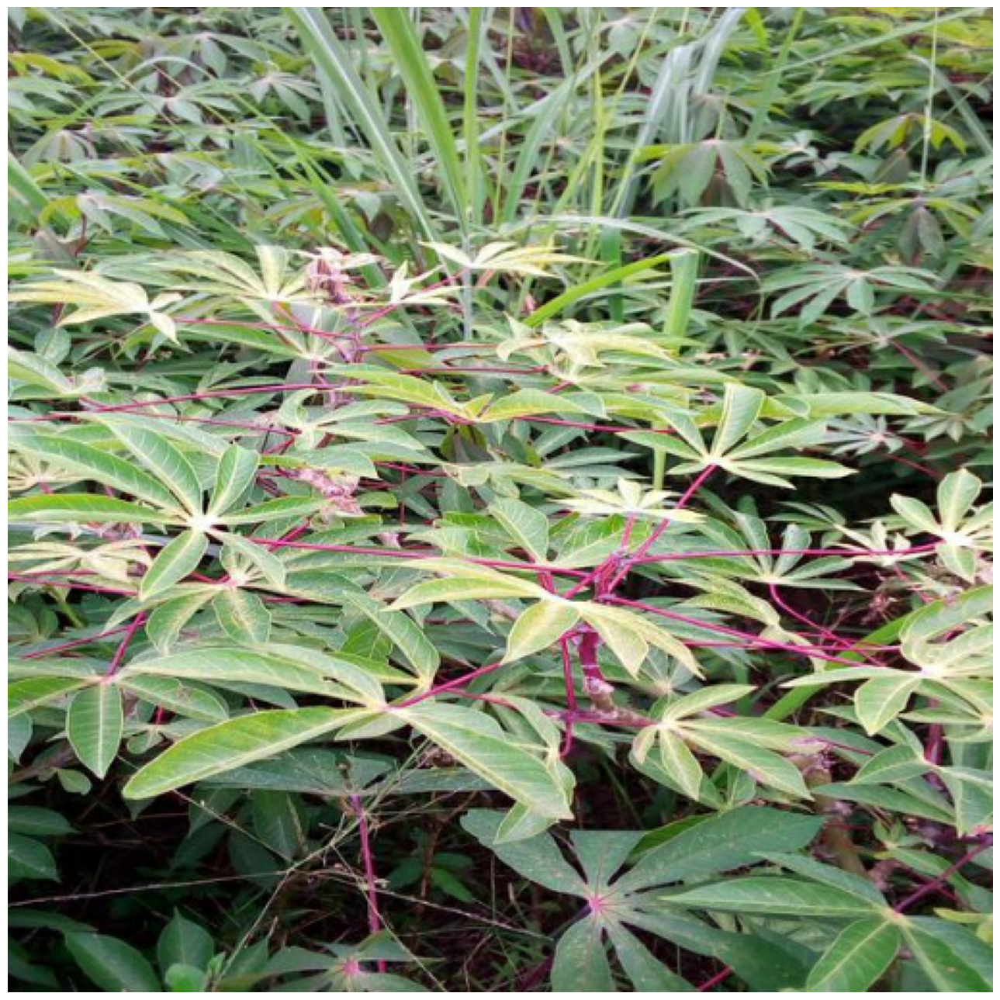

In [92]:
# we only have one test image
display_batch_of_images(next(test_batch))

# Building the Model

## Learning Rate

We learned about learning rates in the Intro to Deep Learning: Stochastic Gradient Descent lesson, and here I've created a learning rate schedule mostly using the defaults in the Keras Exponential Decay Learning Rate Scheduler documentation (I did change the initial_learning_rate. You can adjust the learning rate scheduler below, and read more about the other types of schedulers available to you in the Keras learning rate schedules API.

In [24]:
# This is where we start building our model
lr_scheduler = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-5, 
    decay_steps=10000, 
    decay_rate=0.9)

In order to ensure that our model is trained on the TPU, we build it using with strategy.scope().

This model was built using transfer learning, meaning that we have a pre-trained model (ResNet50) as our base model and then the customizable model built using tf.keras.Sequential. If you're new to transfer learning I recommend setting base_model.trainable to False, but do encourage you to change which base model you're using (more options are available in the tf.keras.applications Module documentation) as well iterate on the custom model.

Note that we're using sparse_categorical_crossentropy as our loss function, because we did not one-hot encode our labels.

In [55]:
with strategy.scope():       
    # Define the input shape explicitly with an Input layer
    inputs = tf.keras.Input(shape=[*IMAGE_SIZE, 3])
    img_adjust_layer = tf.keras.layers.Lambda(tf.keras.applications.resnet50.preprocess_input)(inputs)
    
    base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False)
    base_model.trainable = False
    
    # Start model definition with the Input instance
    x = tf.keras.layers.BatchNormalization()(img_adjust_layer)  # Note: Removed renorm=True as per your comment
    x = base_model(x)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(8, activation='relu')(x)
    outputs = tf.keras.layers.Dense(len(CLASSES), activation='softmax')(x)  
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr_scheduler, epsilon=0.001),
        loss='sparse_categorical_crossentropy',  
        metrics=['sparse_categorical_accuracy'])
    
    # Assume get_training_dataset and get_validation_dataset are defined elsewhere
    train_dataset = get_training_dataset()
    valid_dataset = get_validation_dataset()
    
    # Assume NUM_TRAINING_IMAGES, BATCH_SIZE, and other constants are defined elsewhere
    STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
    VALID_STEPS = NUM_VALIDATION_IMAGES // BATCH_SIZE

    history = model.fit(train_dataset, 
                        steps_per_epoch=STEPS_PER_EPOCH, 
                        epochs=EPOCHS,
                        validation_data=valid_dataset,
                        validation_steps=VALID_STEPS)


Epoch 1/25


2024-04-04 00:20:53.390087: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.


104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step - loss: 9.8083 - sparse_categorical_accuracy: 4.8957

2024-04-04 00:21:57.580395: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.


104/104 ━━━━━━━━━━━━━━━━━━━━ 99s 715ms/step - loss: 9.7262 - sparse_categorical_accuracy: 4.8551 - val_loss: 1.2812 - val_sparse_categorical_accuracy: 0.6139
Epoch 2/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 43s 417ms/step - loss: 9.4904 - sparse_categorical_accuracy: 4.9070 - val_loss: 1.2017 - val_sparse_categorical_accuracy: 0.6250
Epoch 3/25


/usr/local/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


104/104 ━━━━━━━━━━━━━━━━━━━━ 62s 598ms/step - loss: 9.4699 - sparse_categorical_accuracy: 4.8715 - val_loss: 1.1782 - val_sparse_categorical_accuracy: 0.6159
Epoch 4/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 44s 419ms/step - loss: 9.5213 - sparse_categorical_accuracy: 4.8393 - val_loss: 1.0729 - val_sparse_categorical_accuracy: 0.6875
Epoch 5/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 62s 596ms/step - loss: 9.4647 - sparse_categorical_accuracy: 4.8585 - val_loss: 1.1752 - val_sparse_categorical_accuracy: 0.6139
Epoch 6/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 44s 425ms/step - loss: 9.3387 - sparse_categorical_accuracy: 4.9183 - val_loss: 1.0485 - val_sparse_categorical_accuracy: 0.6875
Epoch 7/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 61s 584ms/step - loss: 9.3488 - sparse_categorical_accuracy: 4.8834 - val_loss: 1.1739 - val_sparse_categorical_accuracy: 0.6139
Epoch 8/25
104/104 ━━━━━━━━━━━━━━━━━━━━ 45s 436ms/step - loss: 9.4404 - sparse_categorical_accuracy: 4.8546 - val_loss: 1.0396 - val_sparse_categorical_accuracy: 0.68

# Train the Model

As our model is training you'll see a printout for each epoch, and can also monitor TPU usage by clicking on the TPU metrics in the toolbar at the top right of your notebook.

With model.summary() we'll see a printout of each of our layers, their corresponding shape, as well as the associated number of parameters. Notice that at the bottom of the printout we'll see information on the total parameters, trainable parameters, and non-trainable parameters. Because we're using a pre-trained model, we expect there to be a large number of non-trainable parameters (because the weights have already been assigned in the pre-trained model).

In [57]:
    model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_1 (Lambda)               │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512, 512, 3)    │            12 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 16, 16, 2048)   │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │        16,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │            45 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,637,048 (90.17 MB)

 Trainable params: 16,443 (64.23 KB)

 Non-trainable params: 23,587,718 (89.98 MB)

 Optimizer params: 32,887 (128.47 KB)

# Model Evaluation

The first chunk of code is provided to show you where the variables in the second chunk of code came from. As you can see, there's a lot of room for improvement in this model, but because we're using TPUs and have a relatively short training time, we're able to iterate on our model fairly rapidly.

In [58]:
    # print out variables available to us
    print(history.history.keys())

dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])


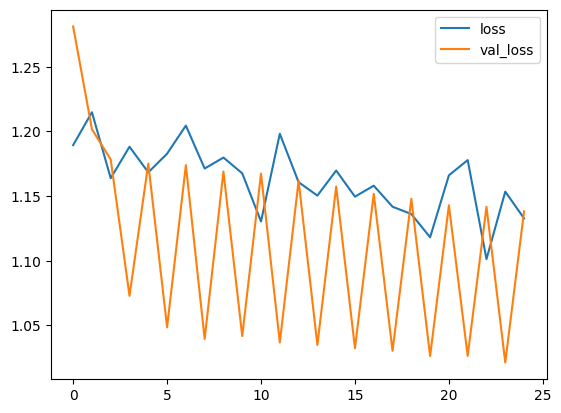

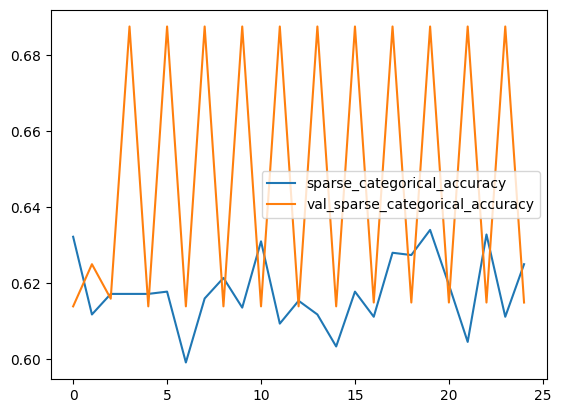

In [59]:
    # create learning curves to evaluate model performance
    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['sparse_categorical_accuracy', 'val_sparse_categorical_accuracy']].plot();

# Model Prediction

In [60]:
    # this code will convert our test image data to a float32 
    def to_float32(image, label):
        return tf.cast(image, tf.float32), label

In [74]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input

In [116]:
with strategy.scope():
    
    # Path to your image
    image_path = '/kaggle/input/cassava-leaf-disease-classification/test_images/2216849948.jpg'

    # Load the image with a target size of (512, 512)
    img = image.load_img(image_path, target_size=(512, 512))

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Preprocess the image for the model (if necessary)
    # This step depends on the model. For ResNet50, we often use preprocess_input from the same module.
    img_array = preprocess_input(img_array)

    # Expand the dimensions so the input has batch size of 1
    img_batch = np.expand_dims(img_array, axis=1)  # Use axis=0 to add the batch dimension

    # Predict the image
    probabilities = model.predict(img_batch)
    prediction = np.argmax(probabilities, axis=-1)
    print(prediction)
    
    predictions = []
    predictions.append(prediction)

    
#     test_ds = get_test_dataset(ordered=True) 
#     test_ds = test_ds.map(to_float32)

#     print('Computing predictions...')
#     test_images_ds = testing_dataset
#     test_images_ds = test_ds.map(lambda image, idnum: image)
# #     test_images_ds = test_images_ds.batch(BATCH_SIZE)
#     print(test_images_ds)
#     print(test_images_ds.element_spec)
#     probabilities = model.predict(test_images_ds)
#     predictions = np.argmax(probabilities, axis=-1)
#     print(predictions)

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step
0


## Saving and loading the model

In [ ]:
from tensorflow.keras.models import save_model
from tensorflow.keras.models import load_model

In [125]:
with strategy.scope():
    model.save("my_model4.keras")

#     # It can be used to reconstruct the model identically.
#     reconstructed_model = keras.models.load_model("/kaggle/working/my_model4.keras")

#     # Let's check:
#     np.testing.assert_allclose(
#         model.predict(img_batch), reconstructed_model.predict(test_input)
#     )

# Submission File

In [108]:
print('Generating submission.csv file...')
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('submission.csv', np.rec.fromarrays([test_ids, predictions]), fmt=['%s', '%d'], delimiter=',', header='id,label', comments='')
!head submission.csv

Generating submission.csv file...
id,label
2216849948.jpg,0
